# BLOCK 2 : Exploratory, descriptive and inferential Data Analysis (EDI)
___

## 1. Requirements

In [1]:
# !pip3 install -r requirements.txt

## 2. Libraries

In [5]:
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.figure_factory as ff
import seaborn as sns
import matplotlib.pyplot as plt
# import pyarrow as pa
# import pyarrow.parquet as pq

## 3. Open PARQUET File

In [3]:
# Load file .parquet to Pandas DF
df = pd.read_parquet(r"C:\WORKSPACES\DATA\PROCESS\iNat_Observations_World_Enriched_FRA.parquet")

OR

In [4]:
# # Load file .parquet
# table = pq.read_table("C:\WORKSPACES\DATA\PROCESS\iNat_Observations_World_EnrichedFRA.parquet")
# # Convert to Pandas DataFrame
# df = table.to_pandas()

## 4. Analysis

### 4.1. Basis Overview

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 70541610 entries, 0 to 70699073
Data columns (total 20 columns):
 #   Column                Dtype         
---  ------                -----         
 0   observation_id        int32         
 1   latitude              float64       
 2   longitude             float64       
 3   coordinate_precision  float64       
 4   state_province        object        
 5   country_code          object        
 6   country_name          object        
 7   taxon_id              int32         
 8   scientific_name       object        
 9   common_name           object        
 10  kingdom               object        
 11  phylum                object        
 12  class                 object        
 13  order                 object        
 14  family                object        
 15  genus                 object        
 16  event_date            datetime64[ns]
 17  year                  int32         
 18  month                 int32         
 19  day

In [6]:
display(df.head())
display(df.tail())

,observation_id,latitude,longitude,coordinate_precision,state_province,country_code,country_name,taxon_id,scientific_name,common_name,kingdom,phylum,class,order,family,genus,event_date,year,month,day
0,113732204,55.007894,73.326651,172.0,Omsk,RUS,"Russie, Fédération de",47602,Taraxacum officinale,Pissenlit Officinal,Plantae,Tracheophyta,Magnoliopsida,Asterales,Asteraceae,Taraxacum,2022-04-30,2022,4,30
1,113732220,24.614161,121.731000,NaN,Taiwan,TWN,"Taïwan, Chine",460193,Potentilla hebiichigo,None,Plantae,Tracheophyta,Magnoliopsida,Rosales,Rosaceae,Potentilla,2022-04-30,2022,4,30
2,113732225,-37.796523,144.914499,31.0,Victoria,AUS,Australie,8042,Corvus mellori,Petit Corbeau,Animalia,Chordata,Aves,Passeriformes,Corvidae,Corvus,2022-04-29,2022,4,29
3,113732226,27.057540,88.254764,NaN,West Bengal,IND,Inde,544430,Castanopsis hystrix,None,Plantae,Tracheophyta,Magnoliopsida,Fagales,Fagaceae,Castanopsis,2010-02-21,2010,2,21
4,113732232,50.247707,41.984521,5.0,Volgograd,RUS,"Russie, Fédération de",1024536,Rabelera holostea,"Langue D'oiseau, Stellaire Holostée",Plantae,Tracheophyta,Magnoliopsida,Caryophyllales,Caryophyllaceae,Rabelera,2022-04-30,2022,4,30


,observation_id,latitude,longitude,coordinate_precision,state_province,country_code,country_name,taxon_id,scientific_name,common_name,kingdom,phylum,class,order,family,genus,event_date,year,month,day
70699069,22746427,8.637565,98.245941,NaN,Phangnga,THA,Thaïlande,123362,Coenobita rugosus,Cénobite Stridulant,Animalia,Arthropoda,Malacostraca,Decapoda,Coenobitidae,Coenobita,2019-04-20,2019,4,20
70699070,22746428,53.185170,83.714812,4.0,Altay,RUS,"Russie, Fédération de",987335,Odontarrhena obovata,None,Plantae,Tracheophyta,Magnoliopsida,Brassicales,Brassicaceae,Odontarrhena,2019-04-20,2019,4,20
70699071,22746429,-36.680057,174.748469,216.0,Auckland,NZL,Nouvelle-Zélande,333759,Larus dominicanus dominicanus,None,Animalia,Chordata,Aves,Charadriiformes,Laridae,Larus,2019-04-18,2019,4,18
70699072,22746430,35.336925,-84.126714,288.0,Tennessee,USA,Etats-Unis,58662,Semotilus atromaculatus,Mulet À Cornes,Animalia,Chordata,Actinopterygii,Cypriniformes,Leuciscidae,Semotilus,2019-04-19,2019,4,19
70699073,22746438,-0.585598,130.536107,NaN,Papua Barat,IDN,Indonésie,97672,Choerodon zosterophorus,None,Animalia,Chordata,Actinopterygii,Perciformes,Labridae,Choerodon,2019-01-10,2019,1,10


### 4.2. Missing and Unique values

In [7]:
df.nunique()

observation_id          70541610
latitude                49999666
longitude               50709317
coordinate_precision      130859
state_province              3354
country_code                 228
country_name                 227
taxon_id                  384822
scientific_name           384172
common_name                37358
kingdom                        8
phylum                        79
class                        238
order                       1044
family                      6157
genus                      65969
event_date                 19988
year                         141
month                         12
day                           31
dtype: int64

In [8]:
df.isna().sum()

observation_id                 0
latitude                       0
longitude                      0
coordinate_precision    13726698
state_province            194144
country_code              180753
country_name              180753
taxon_id                       0
scientific_name                0
common_name             22192528
kingdom                        1
phylum                       276
class                      17420
order                      56705
family                     25490
genus                      26497
event_date                     0
year                           0
month                          0
day                            0
dtype: int64

### 4.3. Descriptive Statistics

In [9]:
# Create a DF with all the numerical columns
df_num_all = df.select_dtypes(include = ["float64", "int32"])

In [10]:
df_num_all.describe().round(2)

,observation_id,latitude,longitude,coordinate_precision,taxon_id,year,month,day
count,7.054161e+07,70541610.00,70541610.00,5.681491e+07,70541610.00,70541610.00,70541610.00,70541610.00
mean,8.989516e+07,31.18,-37.68,5.735670e+03,185786.86,2020.23,6.36,15.87
std,5.197841e+07,25.13,81.01,3.574935e+05,260647.37,3.07,2.78,8.97
min,3.800000e+01,-89.48,-180.00,0.000000e+00,3.00,1768.00,1.00,1.00
25%,4.515071e+07,29.57,-96.99,8.000000e+00,49288.00,2019.00,4.00,8.00
50%,8.991470e+07,38.89,-76.33,3.100000e+01,76607.00,2021.00,6.00,16.00
75%,1.345004e+08,45.56,14.05,2.630000e+02,199840.00,2022.00,8.00,24.00
max,1.819715e+08,907.00,180.00,2.147484e+09,1494090.00,2023.00,12.00,31.00


### 4.4. Correlation Matrix

In [11]:
# Set correlation matrix
corr_matrix_all = df_num_all.corr()

In [21]:
# Create a heatmap with Plotly for all num columns
heatmap = ff.create_annotated_heatmap(
    z = corr_matrix_all.values,
    x = list(corr_matrix_all.columns),
    y = list(corr_matrix_all.index),
    annotation_text = corr_matrix_all.round(2).values,
    showscale = True,
    colorscale = "Oxy"
)

heatmap.layout.title = dict(text = "Correlation Matrix", x = 0.5, xanchor = "center")
heatmap.layout.titlefont = dict(size = 25)
heatmap.layout.margin = dict(t = 190)
heatmap.layout.autosize = False
heatmap.layout.width = 600
heatmap.layout.height = 600
heatmap.show()


### 4.5. Some processing

#### 4.5.1. Coordonate_precision

In [ ]:
df = df.drop(columns = ["coordinate_precision"])

# OR
# df.drop(columns=["coordinate_precision"], inplace = True)

#### 4.5.2. September not full

In [ ]:
df["event_date"].max()

Timestamp('2023-09-06 00:00:00')

In [ ]:
df = df[df["event_date"] < "2023-09-01"]

#### 4.5.3. Latitude

In [ ]:
# Outliers "latitude"
df[df["latitude"] > 90]

,observation_id,latitude,longitude,state_province,country_code,country_name,taxon_id,scientific_name,common_name,kingdom,phylum,class,order,family,genus,event_date,year,month,day
11972905,71594795,907.0,-1.0,None,None,None,1102323,Canthesancus lurco,None,Animalia,Arthropoda,Insecta,Hemiptera,Reduviidae,Canthesancus,2019-04-21,2019,4,21


In [ ]:
df = df.drop(11972905)
# OR
# df.drop(11972905, inplace = True)

In [ ]:
# Check Outliers "latitude"
df[df["latitude"] > 90]

,observation_id,latitude,longitude,state_province,country_code,country_name,taxon_id,scientific_name,common_name,kingdom,phylum,class,order,family,genus,event_date,year,month,day


### 4.6. Visualization

#### 4.6.1. Overview

In [23]:
# Create a DF with selected numerical columns
df_num_sel = df[["latitude", "longitude", "year", "month", "day"]]

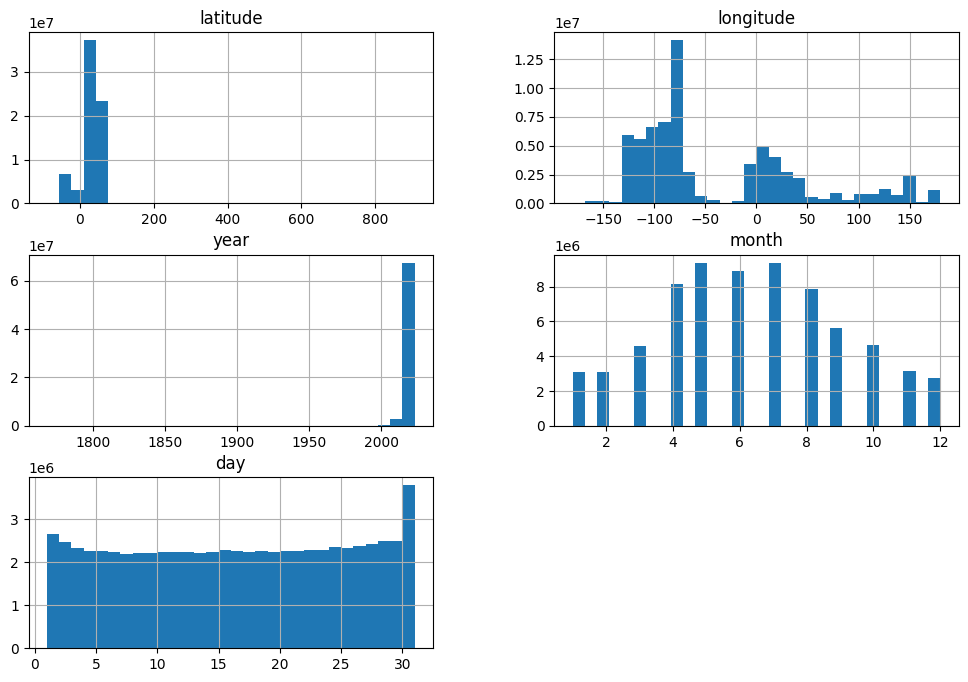

In [24]:
# Plot a histogram for numeric columns
df_num_sel.hist(bins = 30, figsize = (12, 8))
plt.show()

#### 4.6.2. WORLD - Total Observation IDs by Month and Year

In [4]:
# DON'T USE if loaded the parquet file

# Create a new DataFrame with only the "observation_id" and "event_date" columns
df_time = df[["observation_id", "event_date"]].copy()

# Extract the year and month from the "event_date" and create a new column "year_month"
df_time["year_month"] = df_time["event_date"].dt.strftime("%Y-%m")

# Drop the "event_date" column as it's no longer needed
df_time = df_time.drop(columns = ["event_date"])

In [6]:
# Group the data by the "year_month" column and count the total number of observation_ids for each combination
year_month_counts = df_time.groupby("year_month")["observation_id"].count().reset_index()

In [57]:
# Parameters for the histogram
fig = px.bar(
    year_month_counts,
    x = "year_month",
    y = "observation_id",
    labels ={
        "year_month": "Timeline",
        "observation_id": "Total Number of Observation IDs"
    },
    title = "WORLD - Total Observation IDs by Month and Year"
)

fig.update_layout(autosize = False, width = 900, height = 600)
fig.update_xaxes(range = ["2000-01", "2024-12"], nticks = 20, tickangle = 315)  # Set the range of the x-axis

#### 4.6.3. WORLD - Total Observation IDs by Month

In [ ]:
# Group the data by the "month" column and count the total number of observation_ids for each combination
month_counts = df_time.groupby("month")["observation_id"].count().reset_index()

In [58]:
# Parameters for the histogram
fig = px.bar(
    month_counts,
    x = "month",
    y = "observation_id",
    text = month_counts["observation_id"],
    labels ={
        "month": "Month",
        "observation_id": "Total Number of Observation IDs"
    },
    title = "WORLD - Total Observation IDs by Month"
)

fig.update_traces(texttemplate = "%{text:.2s}", textposition = "outside")  # Display the count outside the bar
fig.update_layout(uniformtext_minsize = 8, autosize = False, width = 900, height = 600)  # Ensure the text is large enough to be visible
fig.update_xaxes(tickmode = "array", tickvals = month_counts["month"], ticktext = month_counts["month"])

#### 4.6.4. WORLD - Top 10 Country

In [46]:
# Top 10 World Country
top10_country = df["country_code"].value_counts().head(10)

In [50]:
# Sort the data in order by count
top10_country = top10_country.sort_values(ascending = True)

# Create a bar chart with Plotly
fig = px.bar(
    y = top10_country.index,
    x = top10_country,
    text = top10_country,
    labels = {
        "y": "Country",
        "x": "Count"
        },
    title = "WORLD - Top 10 Country by Count"
    )
fig.update_traces(texttemplate = "%{text:.2s}", textposition = "outside")  # Display the count outside the bar
fig.update_layout(uniformtext_minsize = 8, autosize = False, width = 900, height = 600)  # Ensure the text is large enough to be visible
fig.update_xaxes(tickangle = 315)  # Rotate x-axis labels for better readability

#### 4.6.5. WORLD - Top 10 Taxon

In [79]:
# Top 10 World taxon_id
top10_taxon = df["taxon_id"].value_counts().head(10).reset_index(name = "count")
top10_taxon_viz = top10_taxon.copy()

# OR
# top10_taxon = df["taxon_id"].value_counts().nlargest(10) => nlargest it finds the x highest values, regardless of the order in the dataframe..

In [82]:
# Retrieve 2 columns from DF
top10_taxon_viz["scientific_name"] = top10_taxon_viz["taxon_id"].apply(lambda x: df.loc[df["taxon_id"] == x, "scientific_name"].values[0])
top10_taxon_viz["common_name"] = top10_taxon_viz["taxon_id"].apply(lambda x: df.loc[df["taxon_id"] == x, "common_name"].values[0])

# Reorder the columns
top10_taxon_viz = top10_taxon_viz[["taxon_id", "scientific_name", "common_name", "count"]]

In [88]:
# Sort the data in descending order by count for plotting only
top10_taxon_plot = top10_taxon_viz.sort_values(by = "count", ascending = True)

# Create a bar chart with Plotly
fig = px.bar(
    top10_taxon_plot,
    x = "count",
    y = "scientific_name",
    text = "count",
    labels = {"count": "Count", "scientific_name": "Scientific Name"},
    title = "WORLD - Top 10 Taxon ID by Scientific Name"
)

fig.update_traces(texttemplate = "%{text:.2s}", textposition = "outside")
fig.update_layout(uniformtext_minsize = 8, autosize = False, width = 900, height = 600)
fig.update_xaxes(tickangle = 315)
fig.show()

# Caption
display(top10_taxon_viz)

,taxon_id,scientific_name,common_name,count
0,6930,Anas platyrhynchos,"Canard Colvert, Canard Français",266431
1,47219,Apis mellifera,"Abeille Domestique, Abeille Européenne",234017
2,48662,Danaus plexippus,Monarque,178543
3,48484,Harmonia axyridis,Coccinelle Asiatique,167772
4,13858,Passer domesticus,Moineau Domestique,166348
5,12727,Turdus migratorius,"Merle D'amérique, Rouge Gorge, Rouge-gorge D'a...",163738
6,7089,Branta canadensis,"Bernache Du Canada, Outarde",161940
7,4956,Ardea herodias,Grand Héron,160239
8,144455,Ardea alba,Grande Aigrette,133212
9,46017,Sciurus carolinensis,Écureuil Gris,133064


#### 4.6.6. USA - Top 10 Taxon

In [4]:
# DON'T USE if loaded the parquet

# Filter the DataFrame for rows where country_code is "FRA"
df_usa = df[df["country_code"] == "USA"]

In [11]:
# Top 10 World taxon_id
top10_usa_taxon = df_usa["taxon_id"].value_counts().head(10).reset_index(name="count")
# top10_fra_taxon_viz = top10_fra_taxon.copy()

In [12]:
# Retrieve 2 columns from DF
top10_usa_taxon["scientific_name"] = top10_usa_taxon["taxon_id"].apply(lambda x: df.loc[df["taxon_id"] == x, "scientific_name"].values[0])
top10_usa_taxon["common_name"] = top10_usa_taxon["taxon_id"].apply(lambda x: df.loc[df["taxon_id"] == x, "common_name"].values[0])

# Reorder the columns
top10_usa_taxon = top10_usa_taxon[["taxon_id", "scientific_name", "common_name", "count"]]

In [13]:
# Sort the data in descending order by count for plotting only
top10_usa_taxon_plot = top10_usa_taxon.sort_values(by = "count", ascending = True)

# Create a bar chart with Plotly
fig = px.bar(
    top10_usa_taxon_plot,
    x = "count",
    y = "scientific_name",
    text = "count",
    labels = {"count": "Count", "scientific_name": "Scientific Name"},
    title = "USA - Top 10 Taxon ID by Scientific Name"
)

fig.update_traces(texttemplate="%{text:.2s}", textposition = "outside")
fig.update_layout(uniformtext_minsize = 8, autosize = False, width = 900, height = 600)
fig.update_xaxes(tickangle = 315)
fig.show()

# Caption
display(top10_usa_taxon)

,taxon_id,scientific_name,common_name,count
0,48662,Danaus plexippus,Monarque,136347
1,47219,Apis mellifera,"Abeille Domestique, Abeille Européenne",135977
2,6930,Anas platyrhynchos,"Canard Colvert, Canard Français",130222
3,4956,Ardea herodias,Grand Héron,129176
4,12727,Turdus migratorius,"Merle D'amérique, Rouge Gorge, Rouge-gorge D'a...",127448
5,7089,Branta canadensis,"Bernache Du Canada, Outarde",114665
6,9083,Cardinalis cardinalis,Cardinal Rouge,110261
7,5212,Buteo jamaicensis,Buse À Queue Rousse,108443
8,42223,Odocoileus virginianus,"Cerf De Virginie, Chevreuil",108100
9,46017,Sciurus carolinensis,Écureuil Gris,102845


In [ ]:
# DON'T USE if loaded the parquet

# Filter the DataFrame for rows where country_code is "FRA"
df_fra = df[df["country_code"] == "FRA"]

In [ ]:
# Top 10 World taxon_id
top10_fra_taxon = df_fra["taxon_id"].value_counts().head(10).reset_index(name="count")
# top10_fra_taxon_viz = top10_fra_taxon.copy()

In [ ]:
# Retrieve 2 columns from DF
top10_fra_taxon["scientific_name"] = top10_fra_taxon["taxon_id"].apply(lambda x: df.loc[df["taxon_id"] == x, "scientific_name"].values[0])
top10_fra_taxon["common_name"] = top10_fra_taxon["taxon_id"].apply(lambda x: df.loc[df["taxon_id"] == x, "common_name"].values[0])

# Reorder the columns
top10_fra_taxon = top10_fra_taxon[["taxon_id", "scientific_name", "common_name", "count"]]

In [ ]:
# Sort the data in descending order by count for plotting only
top10_fra_taxon_plot = top10_fra_taxon.sort_values(by = "count", ascending = True)

# Create a bar chart with Plotly
fig = px.bar(
    top10_fra_taxon_plot,
    x = "count",
    y = "scientific_name",
    text = "count",
    labels = {"count": "Count", "scientific_name": "Scientific Name"},
    title = "FRANCE - Top 10 Taxon ID by Scientific Name"
)

fig.update_traces(texttemplate="%{text:.2s}", textposition = "outside")
fig.update_layout(uniformtext_minsize = 8, autosize = False, width = 900, height = 600)
fig.update_xaxes(tickangle = 315)
fig.show()

# Caption
display(top10_fra_taxon)

,taxon_id,scientific_name,common_name,count
0,55990,Podarcis muralis,Lézard Des Murailles,6314
1,48484,Harmonia axyridis,Coccinelle Asiatique,5134
2,52592,Pararge aegeria,Tircis,4369
3,51702,Coccinella septempunctata,Coccinelle À Sept Points,4312
4,6930,Anas platyrhynchos,"Canard Colvert, Canard Français",3706
5,47219,Apis mellifera,"Abeille Domestique, Abeille Européenne",3664
6,13094,Erithacus rubecula,"Rouge-gorge Familier, Rougegorge Familier",3582
7,55610,Pyrrhocoris apterus,"Gendarme, Pyrrhocore, Cherche-midi, Lygée Aptè...",3552
8,4954,Ardea cinerea,Héron Cendré,3525
9,10070,Fringilla coelebs,Pinson Des Arbres,3423


#### 4.6.7A. FRANCE - Top 10 Taxon

In [ ]:
# DON'T USE if loaded the parquet

# Filter the DataFrame for rows where country_code is "FRA"
df_fra = df[df["country_code"] == "FRA"]

In [ ]:
# Top 10 World taxon_id
top10_fra_taxon = df_fra["taxon_id"].value_counts().head(10).reset_index(name = "count")
# top10_fra_taxon_viz = top10_fra_taxon.copy()

In [ ]:
# Retrieve 2 columns from DF
top10_fra_taxon["scientific_name"] = top10_fra_taxon["taxon_id"].apply(lambda x: df.loc[df["taxon_id"] == x, "scientific_name"].values[0])
top10_fra_taxon["common_name"] = top10_fra_taxon["taxon_id"].apply(lambda x: df.loc[df["taxon_id"] == x, "common_name"].values[0])

# Reorder the columns
top10_fra_taxon = top10_fra_taxon[["taxon_id", "scientific_name", "common_name", "count"]]

In [ ]:
# Sort the data in descending order by count for plotting only
top10_fra_taxon_plot = top10_fra_taxon.sort_values(by = "count", ascending = True)

# Create a bar chart with Plotly
fig = px.bar(
    top10_fra_taxon_plot,
    x = "count",
    y = "scientific_name",
    text = "count",
    labels = {"count": "Count", "scientific_name": "Scientific Name"},
    title = "FRANCE - Top 10 Taxon ID by Scientific Name"
)

fig.update_traces(texttemplate="%{text:.2s}", textposition = "outside")
fig.update_layout(uniformtext_minsize = 8, autosize = False, width = 900, height = 600)
fig.update_xaxes(tickangle = 315)
fig.show()

# Caption
display(top10_fra_taxon)

,taxon_id,scientific_name,common_name,count
0,55990,Podarcis muralis,Lézard Des Murailles,6314
1,48484,Harmonia axyridis,Coccinelle Asiatique,5134
2,52592,Pararge aegeria,Tircis,4369
3,51702,Coccinella septempunctata,Coccinelle À Sept Points,4312
4,6930,Anas platyrhynchos,"Canard Colvert, Canard Français",3706
5,47219,Apis mellifera,"Abeille Domestique, Abeille Européenne",3664
6,13094,Erithacus rubecula,"Rouge-gorge Familier, Rougegorge Familier",3582
7,55610,Pyrrhocoris apterus,"Gendarme, Pyrrhocore, Cherche-midi, Lygée Aptè...",3552
8,4954,Ardea cinerea,Héron Cendré,3525
9,10070,Fringilla coelebs,Pinson Des Arbres,3423


In [65]:
# DON'T USE if loaded the parquet

# Filter the DataFrame for rows where country_code is "FRA"
df_fra = df[df["country_code"] == "FRA"]

In [10]:
# Top 10 World taxon_id
top10_fra_taxon = df_fra["taxon_id"].value_counts().head(10).reset_index(name="count")
# top10_fra_taxon_viz = top10_fra_taxon.copy()

In [11]:
# Retrieve 2 columns from DF
top10_fra_taxon['scientific_name'] = top10_fra_taxon['taxon_id'].apply(lambda x: df.loc[df['taxon_id'] == x, 'scientific_name'].values[0])
top10_fra_taxon['common_name'] = top10_fra_taxon['taxon_id'].apply(lambda x: df.loc[df['taxon_id'] == x, 'common_name'].values[0])

# Reorder the columns
top10_fra_taxon = top10_fra_taxon[['taxon_id', 'scientific_name', 'common_name', 'count']]

In [9]:
# Sort the data in descending order by count for plotting only
top10_fra_taxon_plot = top10_fra_taxon.sort_values(by = "count", ascending = True)

# Create a bar chart with Plotly
fig = px.bar(
    top10_fra_taxon_plot,
    x = "count",
    y = "scientific_name",
    text = "count",
    labels = {"count": "Count", "scientific_name": "Scientific Name"},
    title = "FRANCE - Top 10 Taxon ID by Scientific Name"
)

fig.update_traces(texttemplate="%{text:.2s}", textposition = "outside")
fig.update_layout(uniformtext_minsize = 8, autosize = False, width = 900, height = 600)
fig.update_xaxes(tickangle = 315)
fig.show()

# Caption
display(top10_fra_taxon)

,taxon_id,scientific_name,common_name,count
0,55990,Podarcis muralis,Lézard Des Murailles,6314
1,48484,Harmonia axyridis,Coccinelle Asiatique,5134
2,52592,Pararge aegeria,Tircis,4369
3,51702,Coccinella septempunctata,Coccinelle À Sept Points,4312
4,6930,Anas platyrhynchos,"Canard Colvert, Canard Français",3706
5,47219,Apis mellifera,"Abeille Domestique, Abeille Européenne",3664
6,13094,Erithacus rubecula,"Rouge-gorge Familier, Rougegorge Familier",3582
7,55610,Pyrrhocoris apterus,"Gendarme, Pyrrhocore, Cherche-midi, Lygée Aptè...",3552
8,4954,Ardea cinerea,Héron Cendré,3525
9,10070,Fringilla coelebs,Pinson Des Arbres,3423


#### 4.6.7B. FRANCE - Top 10 to TABLEAU

https://public.tableau.com/app/profile/kwinetine/viz/FRA-Abeillesdomestiques/Feuille1

In [34]:
top10_fra_taxon_viz = top10_fra_taxon.merge(df_fra[["taxon_id", "latitude", "longitude", "event_date", "year", "month"]], on = "taxon_id")

In [36]:
# Extract the year and month from the "event_date" and create a new column "year_month"
top10_fra_taxon_viz["year_month"] = top10_fra_taxon_viz["event_date"].dt.strftime("%Y-%m")

# Drop the "event_date" column as it's no longer needed
top10_fra_taxon_viz = top10_fra_taxon_viz.drop(columns = ["count"])

In [ ]:
output_csv_path = r"C:\WORKSPACES\DATA\TRANSFORMED\iNat_top10_fra_taxon_viz.csv"
top10_fra_taxon_viz.to_csv(output_csv_path, index = False, encoding = "utf-8")

#### 4.6.8. FRANCE - Podarcis Muralis / Hibernation (Lézard des murailles)

In [4]:
# Filter FRA dataset
df_55990 = df_fra[df_fra["taxon_id"] == 55990]

# Reset the index if needed
df_55990.reset_index(drop = True, inplace = True)

In [5]:
# Extract the year and month from the "event_date" and create a new column "year_month"
df_55990["year_month"] = df_55990["event_date"].dt.strftime("%Y-%m")

# Group by year_month and calculate the count
grouped_view = df_55990.groupby("year_month").size().reset_index(name = "count")

# Sort the dataframe
grouped_view = grouped_view.sort_values(by = "year_month", ascending = True)

In [11]:
# Parameters bar chart
fig = px.bar(grouped_view, x = "year_month", y = "count", title = "Total of Taxon ID 55990 (Podarcis Muralis) by Year_Month")
fig.update_xaxes(type = "category")
fig.update_layout(xaxis_title = "Year_Month", yaxis_title = "Count")

# Show the plot
fig.show()

In [208]:
# Filter
df_55990 = df_55990.loc[df_55990["year_month"] >= "2013-01"]

df_55990.sort_values(by = "year_month", ascending = True, inplace = True)

# Reset the index if needed
df_55990.reset_index(drop=True, inplace=True)

In [ ]:
# Group by year_month and calculate the count
grouped_test = df_55990.groupby('year_month').size().reset_index(name='count')

# Sort the 'grouped' dataframe by 'year_month' in ascending order
grouped_test = grouped_test.sort_values(by = "year_month", ascending = True)

In [212]:
# Create a bar chart without dynamic timeline
fig = px.bar(grouped_test, x='year_month', y='count', title='Total of Taxon ID 55990 by Year_Month')
fig.update_xaxes(type='category')
fig.update_layout(xaxis_title = "Year_Month", yaxis_title = "Count")

fig.update_layout(autosize = False, width = 900, height = 600)
fig.update_xaxes(range = ["2010-01", "2024-12"], nticks = 20, tickangle = 315)  # Set the range of the x-axis

# Show the plot
fig.show()

In [215]:
# Group by year_month and select the desired columns
grouped_55990 = df_55990.groupby(["year_month", "country_code", "state_province", "longitude", "latitude"]).size().reset_index(name='count')

In [216]:
import plotly.express as px

# Create a dynamic map with a timeline using Plotly Express
fig = px.scatter_geo(grouped_55990, 
                     lat="latitude", 
                     lon="longitude",
                     color="count",
                     projection="natural earth",
                     animation_frame="year_month",
                     title="Observations by Month with Count in FRANCE",
                     labels={"count": "Observation Count"},
                     template="plotly_dark",
                     color_continuous_scale="YlOrRd")

# Set longitude and latitude bounds to focus on USA and Mexico
fig.update_geos(
    lataxis_range=[41, 51],  # Adjust latitude range to focus on France
    lonaxis_range=[-5, 9]  # Adjust longitude range to focus on France
)

fig.update_layout(
    height = 800  # Set the desired height in pixels
)

# Show the map
fig.show()


#### 4.6.9. USA/MEX - Danaus Plexippus / Migration (Papillon Monarque)

In [197]:
df_48662 = df[df["taxon_id"] == 48662]

In [198]:
df_48662 = df_48662.loc[df_48662["country_code"].isin(["USA", "MEX"])]

# Reset the index if needed
df_48662.reset_index(drop = True, inplace = True)

In [199]:
# Extract the year and month from the "event_date" and create a new column "year_month"
df_48662["year_month"] = df_48662["event_date"].dt.strftime("%Y-%m")

In [200]:
# Group by year_month and calculate the count
grouped_view = df_48662.groupby('year_month').size().reset_index(name='count')

# Sort the 'grouped' dataframe by 'year_month' in ascending order
grouped_view = grouped_view.sort_values(by = "year_month", ascending = True)

# Create a bar chart without dynamic timeline
fig = px.bar(grouped_view, x='year_month', y='count', title='Total of Taxon ID 48662 by Year_Month')
fig.update_xaxes(type='category')
fig.update_layout(xaxis_title = "Year_Month", yaxis_title = "Count")

# Show the plot
fig.show()

In [201]:
# Filter
df_48662 = df_48662.loc[df_48662["year_month"] >= "2013-01"]

df_48662.sort_values(by = "year_month", ascending = True, inplace = True)

# Reset the index if needed
df_48662.reset_index(drop=True, inplace=True)


In [209]:
# Group by year_month and calculate the count
grouped_test = df_48662.groupby('year_month').size().reset_index(name='count')

# Sort the dataframe by 'year_month' in ascending order
grouped_test = grouped_test.sort_values(by = "year_month", ascending = True)

In [210]:
# Create a bar chart without dynamic timeline
fig = px.bar(grouped_test, x='year_month', y='count', title='Total of Taxon ID 48662 by Year_Month')
fig.update_xaxes(type='category')
fig.update_layout(xaxis_title = "Year_Month", yaxis_title = "Count")

fig.update_layout(autosize = False, width = 900, height = 600)
fig.update_xaxes(range = ["2010-01", "2024-12"], nticks = 20, tickangle = 315)  # Set the range of the x-axis

# Show the plot
fig.show()

In [204]:
# Group by year_month and select the desired columns
grouped_48662 = df_48662.groupby(['year_month', 'country_code', 'state_province', 'longitude', 'latitude']).size().reset_index(name='count')

In [ ]:
custom_color_scale = px.colors.qualitative.Pastel[:len(df)]
 
# Create an interactive world map using Plotly Express
fig = px.choropleth(
    df,
    locations="Country',
    locationmode='country names',
    color='Population',
    hover_name='Country',
    hover_data=['Population'],
    color_discrete_sequence=custom_color_scale,
    title='Top 10 Most Populous Countries"
)
 
fig.show()

In [205]:
# Create a dynamic map with a timeline using Plotly Express
fig = px.scatter_geo(
    grouped_48662,
    lat = "latitude",
    lon = "longitude",
    color = "count",
    projection = "natural earth",
    animation_frame = "year_month",
    title = "Observations by Month with Count in USA and Mexico",
    labels = {"count": "Observation Count"},
    template = "plotly_dark",
    color_continuous_scale = "YlOrRd"
)

# Set longitude and latitude bounds to focus on USA and Mexico
fig.update_geos(
    lataxis_range = [10, 55],
    lonaxis_range = [-140, -50]
)

fig.update_layout(
    height = 800
)

# Show the map
fig.show()


## 5. Save

 ### 5.1. Save DF to PARQUET

In [45]:
# df_obs_sorted = df.sort_values(by = "observation_id", ascending = True)

# Filename & Path
output_path = r"C:\WORKSPACES\DATA\TRANSFORMED\iNat_Observations_World_Enriched_FRA.parquet"

# Save to .parquet with Pandas
df.to_parquet(output_path, index = False)


### 5.2. Save df_time to PARQUET

In [15]:
# Filename & Path
output_parquet_path = r"C:\WORKSPACES\DATA\TRANSFORMED\iNat_df_time.parquet"

# Save to .parquet with Pandas
df_time.to_parquet(output_parquet_path, index = False)

### 5.3. Save df_usa

In [14]:
# Filename & Path
output_parquet_path = r"C:\WORKSPACES\DATA\TRANSFORMED\iNat_df_usa.parquet"

# Save to .parquet with Pandas
df_usa.to_parquet(output_parquet_path, index = False)

### 5.3. Save df_fra

In [ ]:
# Filename & Path
output_parquet_path = r"C:\WORKSPACES\DATA\TRANSFORMED\iNat_df_fra.parquet"

# Save to .parquet with Pandas
df_fra.to_parquet(output_parquet_path, index = False)

In [ ]:
# Filename & Path
output_csv_path = r"C:\WORKSPACES\DATA\TRANSFORMED\iNat_df_fra.csv"

# Save to CSV with UTF-8 encoding
df_fra.to_csv(output_csv_path, index = False, encoding = "utf-8")


### 5.4. Save df_mex

In [148]:
# Filename & Path
output_parquet_path = r"C:\WORKSPACES\DATA\TRANSFORMED\iNat_df_mex.parquet"

# Save to .parquet with Pandas
df_mex.to_parquet(output_parquet_path, index = False)

### 5.4. Save different DF

In [5]:
output_parquet_path = r"C:\WORKSPACES\DATA\TRANSFORMED\iNat_df_48662.parquet"
df_48662.to_parquet(output_parquet_path, index = False)

In [7]:
output_parquet_path = r"C:\WORKSPACES\DATA\TRANSFORMED\iNat_df_4956.parquet"
df_4956.to_parquet(output_parquet_path, index = False)

## 6. Load

In [2]:
import pandas as pd
# import numpy as np
import plotly.express as px
# import seaborn as sns
# import matplotlib.pyplot as plt

In [3]:
df = pd.read_parquet(r"C:\WORKSPACES\DATA\TRANSFORMED\iNat_Observations_World_Enriched_FRA.parquet")

In [ ]:
df_time = pd.read_parquet(r"C:\WORKSPACES\DATA\TRANSFORMED\iNat_df_time.parquet")

In [3]:
df_fra = pd.read_parquet(r"C:\WORKSPACES\DATA\TRANSFORMED\iNat_df_fra.parquet")

In [ ]:
df_fra = pd.read_parquet(r"C:\WORKSPACES\DATA\TRANSFORMED\iNat_df_48662.parquet")